# Set-up

In [1]:
import os
import numpy as np
import sys
import pandas as pd
import xarray as xr
import tensorflow as tf
from tensorflow import keras
import keras.backend as K
import joblib
import pickle

import matplotlib.pyplot as plt
import seaborn as sns
from functools import partial
from matplotlib import colors
from matplotlib import ticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from cmcrameri import cm

from treeconfigparser import TreeConfigParser

os.chdir("/cerea_raid/users/dumontj/dev/coco2/dl")
import models.reg as rg
import models.seg as sg
from data.Data import Data
from include.loss import pixel_weighted_cross_entropy
from include import generators

import matplotlib_functions
matplotlib_functions.setMatplotlibParam()
plt.viridis()

dir_res = "/cerea_raid/users/dumontj/dev/coco2/dl/res"
dir_plots = "/cerea_raid/users/dumontj/dev/coco2/dl/eval/pres-seg"

Segmentation Models: using `keras` framework.


<Figure size 1800x1200 with 0 Axes>

In [2]:
def get_data(name_ds: str, scaler, mode: str):
    config = TreeConfigParser()
    config.readfiles(os.path.join(dir_res, name_ds, "config.cfg"))
    with open(os.path.join(name_ds, "tv_inds.pkl"), "rb") as handle:
        tv_inds = pickle.load(handle)
    data = Data(config, tv_inds, mode)
    data.prepare_input(scaler)
    data.prepare_output()
    return data
def get_data_name(weights: str):
    config_weights = TreeConfigParser()
    config_weights.readfiles(os.path.join(dir_res, weights, "config.cfg"))
    weights_ds = config_weights.get("data.directory.name")
    return weights_ds
    
mode = "test"

In [3]:
def get_model(path_w: str):
    model = keras.models.load_model(os.path.join(path_w, "weights_cp_best.h5"), compile=False)
    model.compile('adam', loss=pixel_weighted_cross_entropy)    
    return model

def get_scaler(path_w: str):
    scaler = joblib.load(os.path.join(path_w, "scaler.save"))
    return scaler

# Synthetic datasets draw (figure 1)

In [3]:
ds = xr.open_dataset("/libre/dumontj/coco2/dl-input/LS_pPGIBPW/dataset.nc")

In [149]:
def add_left_colorbar(contour, ax):
    cax = ax.inset_axes((-0.07, 0, 0.05, 1))
    cax.grid(False)
    cbar = plt.colorbar(contour, cax=cax)
    cax.yaxis.set_ticks_position("left")
    cbar.locator = ticker.MaxNLocator(nbins=6)
    cbar.update_ticks()
    cbar.ax.tick_params(labelsize="7")
    cbar.set_ticks([float(item) for item in cbar.get_ticks()])
    cbar.set_ticklabels(["{0:.1f}".format(i) for i in cbar.get_ticks()])    

In [106]:
def add_right_colorbar(contour,ax):
    cax = ax.inset_axes((1.02, 0, 0.05, 1))
    cax.grid(False)
    cbar = plt.colorbar(contour, cax, orientation="vertical", label="XCO2 [ppmv]")
    cbar.locator = ticker.MaxNLocator(nbins=6)
    cbar.update_ticks()
    cbar.ax.tick_params(labelsize="7")
    cbar.set_ticks([float(item) for item in cbar.get_ticks()])
    cbar.set_ticklabels(["{0:.0f}".format(i) for i in cbar.get_ticks()])

### Berlin

In [141]:
idx_img_ber = np.random.choice(ds.sel(idx_img=ds["point_source"]=="smart_pBer_nBBer")["idx_img"].values)
da_idx_ber = ds.sel(idx_img=idx_img_ber)

In [98]:
idx_img_ber = 35824
da_idx_ber = ds.sel(idx_img=idx_img_ber)

### Paris

In [102]:
idx_img_par = np.random.choice(ds.sel(idx_img=ds["point_source"]=="lsce_pPGI_nBBO")["idx_img"].values)
da_idx_par = ds.sel(idx_img=idx_img_par)

In [104]:
idx_img_par = 29564
da_idx_par = ds.sel(idx_img=idx_img_par)

### Janswchälde

In [131]:
idx_img_jan = np.random.choice(ds.sel(idx_img=ds["point_source"]=="smart_pJan_nBJan")["idx_img"].values)
da_idx_jan = ds.sel(idx_img=idx_img_jan)

In [136]:
idx_img_jan = 10056
da_idx_jan = ds.sel(idx_img=idx_img_jan)

10056

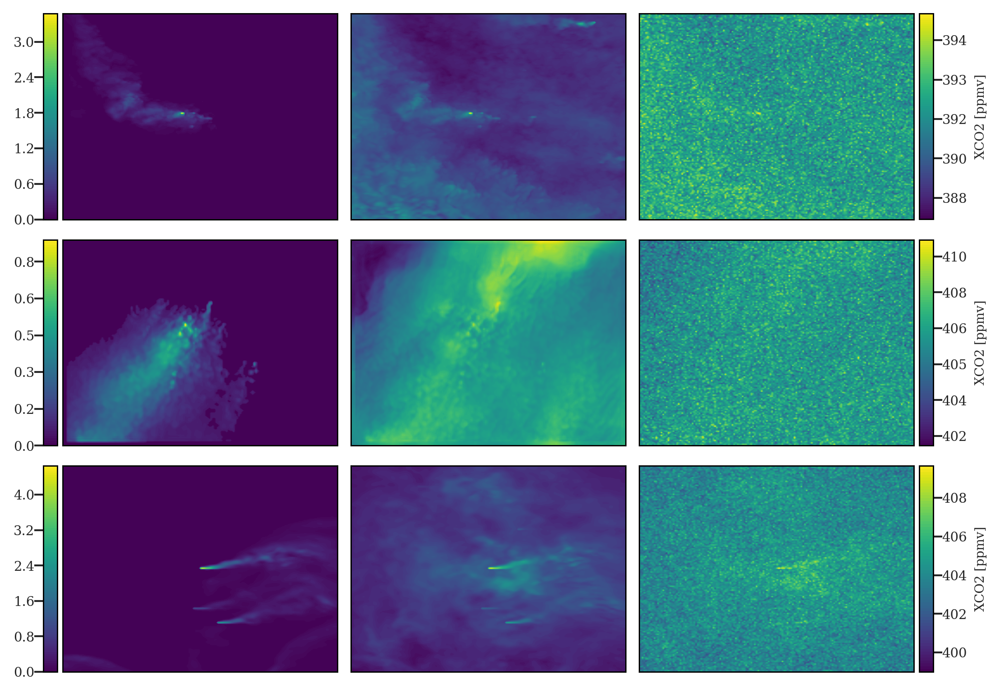

In [151]:
axs = matplotlib_functions.set_figure_axs(3,3, pad_w_int=0.1, pad_h_int = 0.15, pad_w_ext_left=0.4, pad_w_ext_right=0.6)

contour_0 = axs[0].contourf(da_idx_ber["trace"],cmap="viridis", levels=100)
contour_1 = axs[1].contourf(da_idx_ber["xco2"],cmap="viridis", levels=100)
contour_2 = axs[2].contourf(da_idx_ber["xco2"]+np.random.normal(size=da_idx_ber["xco2"].shape),cmap="viridis", levels=100)

contour_3 = axs[3].contourf(da_idx_par["trace"],cmap="viridis", levels=100)
contour_4 = axs[4].contourf(da_idx_par["xco2"],cmap="viridis", levels=100)
contour_5 = axs[5].contourf(da_idx_par["xco2"]+np.random.normal(size=da_idx_par["xco2"].shape),cmap="viridis", levels=100)

contour_6 = axs[6].contourf(da_idx_jan["trace"],cmap="viridis", levels=100)
contour_7 = axs[7].contourf(da_idx_jan["xco2"],cmap="viridis", levels=100)
contour_8 = axs[8].contourf(da_idx_jan["xco2"]+np.random.normal(size=da_idx_jan["xco2"].shape),cmap="viridis", levels=100)

add_right_colorbar(contour_2,axs[2])
add_right_colorbar(contour_5,axs[5])
add_right_colorbar(contour_8,axs[8])

add_left_colorbar(contour_0, axs[0])
add_left_colorbar(contour_3, axs[3])
add_left_colorbar(contour_6, axs[6])

for idx in range(9):
    axs[idx].set_xticklabels([])
    axs[idx].set_yticklabels([])
"""
axs[0].text(0.03, 0.93, "(a)", transform = axs[0].transAxes, color="white")
axs[1].text(0.03, 0.93, "(b)", transform = axs[1].transAxes, color="white")
axs[2].text(0.03, 0.93, "(c)", transform = axs[2].transAxes, color="white")
"""
plt.savefig (os.path.join(dir_plots, f"paper_creation_input_{idx_img_ber}_{idx_img_par}_{idx_img_jan}.png"))

# Data augmentation (figure 2)

In [3]:
matplotlib_functions.setMatplotlibParam()
plt.viridis()

<Figure size 1800x1200 with 0 Axes>

In [4]:
fig1_ds = "smart_pLip_nBLip"
ds = xr.open_dataset(f"/libre/dumontj/coco2/xco2_emi_scenarii/{fig1_ds}/dataset.nc")

In [5]:
xco2 = np.expand_dims(ds.xco2.values, -1)
plume = np.expand_dims(ds.plume.values, -1)

In [6]:
generator = generators.Generator(model_purpose="segmentation_weighted", 
                                 shift_range=0.2, 
                                 zoom_range=0.2,
                                shear_range=45,
                                rotation_range = 180,
                                flip = True)
t = np.random.choice(2000)
generator.flow([xco2[t:t+1]], plume[t:t+1])

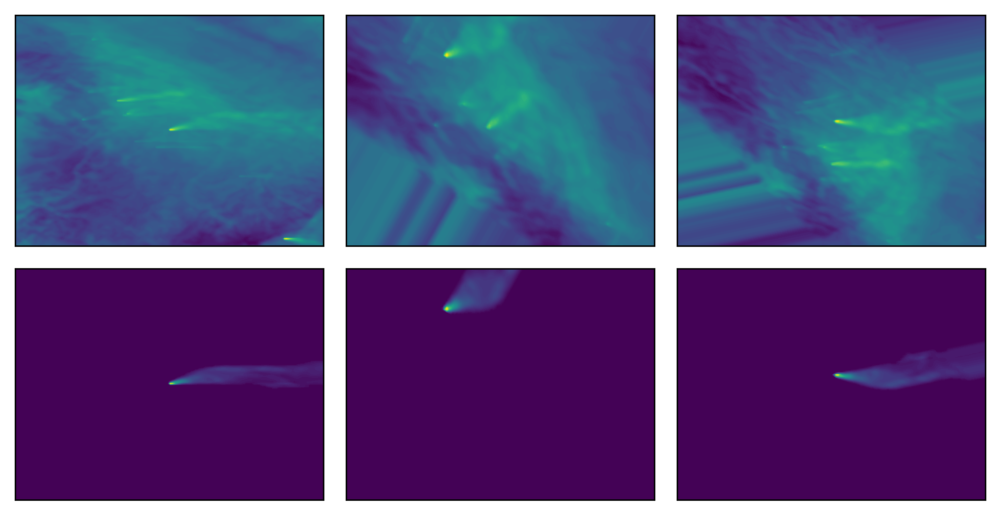

In [9]:
axs = matplotlib_functions.set_figure_axs(2,3, pad_w_ext_left=0.1, pad_w_ext_right=0.1, 
                                          pad_w_int=0.15, pad_h_ext=0.2, pad_h_int=0.15)
axs[0].contourf(xco2[t,:,:,0], levels=100)
axs[3].contourf(plume[t,:,:,0], levels=100)
for i in range(0,2):
    x,y = generator.next()
    image = x[0]
    label = y[0]
    axs[1+i].contourf(image[:,:,0], levels=100)
    axs[4+i].contourf(label[:,:,0], levels=100)
for ax in axs:
    ax.set_xticklabels([])
    ax.set_yticklabels([])
plt.savefig (os.path.join(dir_plots, f"paper_data_generation_light.png"))    

# Plume segmentation purpose (figure 3)

In [5]:
fig3_ds = "S_pBer"
ds = xr.open_dataset(f"/libre/dumontj/coco2/dl-input/{fig3_ds}/2d_train_valid_dataset.nc")

In [6]:
idx0 = int(np.random.uniform(0,len(ds.idx_img)))
idx0 = 2883
ds_idx = ds.isel(idx_img=idx0)
print("idx:", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

idx: 2883
origin: smart_pBer_nBBer
time: 2015-05-21T03:00:00.000000000
emiss: [8.138228 7.341655 7.157905 7.644752 8.319039 9.249243]


<Figure size 1800x1200 with 0 Axes>

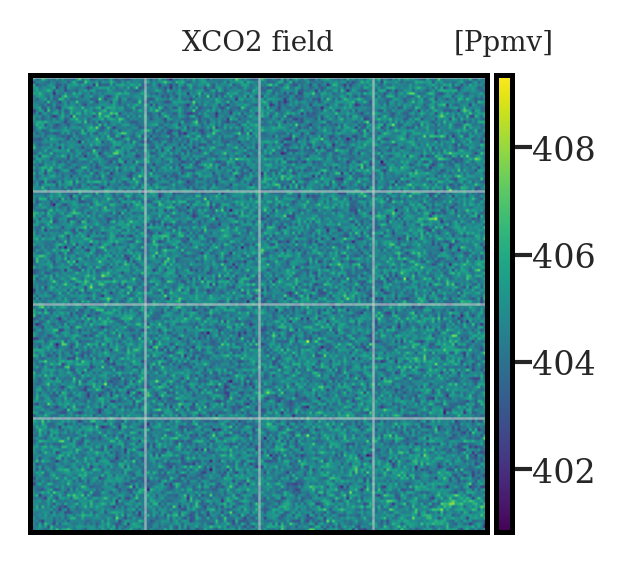

In [12]:
plt.viridis()
axs = matplotlib_functions.set_figure_axs(1, 1, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(np.squeeze(ds.xco2[idx0].values)+np.random.randn(160,160))
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
axs[0].set_title("XCO2 field")
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.tick_params(labelsize="8")
cbar0.ax.set_title('[Ppmv]')
plt.savefig (os.path.join(dir_plots, f"paper_seg_ds{fig3_ds}_xco2_i{idx0}.png"), transparent=True)

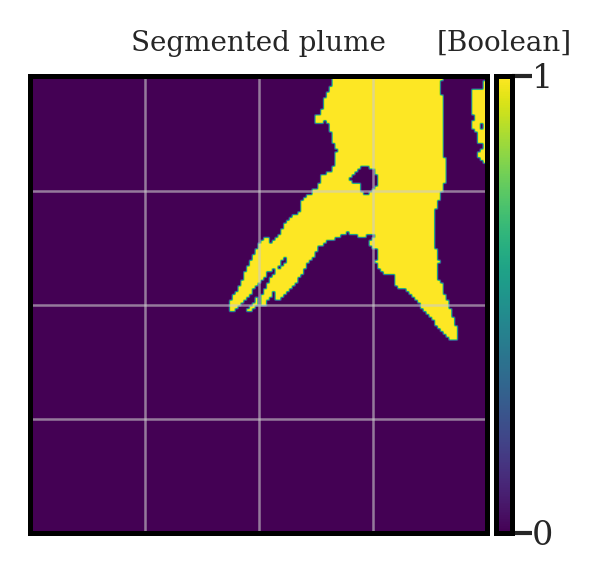

In [20]:
axs = matplotlib_functions.set_figure_axs(1, 1, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(np.where(np.squeeze(ds.plume[idx0].values)>0, 1,0))
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
axs[0].set_title("Segmented plume")
cbar0 = plt.colorbar(im0, cax0, orientation="vertical", ticks=[0, 1])
cbar0.ax.tick_params(labelsize="8")
cbar0.ax.set_title('[Boolean]')
plt.savefig (os.path.join(dir_plots, f"paper_seg_ds{fig3_ds}_seg_i{idx0}.png"), transparent=True)

# Pixel weighted justification (figure 4)

In [21]:
config = TreeConfigParser()
name_run = "seg_pPGIBPP"
config.readfiles(os.path.join(dir_res, name_run, "config.cfg"))
with open(os.path.join(dir_res, name_run, "tv_inds.pkl"), "rb") as handle:
    tv_inds = pickle.load(handle)
data = Data(config,None)
data.prepare_input()
data.prepare_output()
ds = xr.open_dataset(data.path_dataset)
ds_train = ds.sel(idx_img=data.eval_shuffler.ds_inds["train"])

data.shape (33652, 160, 160, 1)
data.x.train.shape (29908, 160, 160, 1)
data.y.train.shape (29908, 160, 160, 1)


In [22]:
idx0 = int(np.random.uniform(0,data.y.train.shape[0]))
idx0 = 23650
ds_idx = ds_train.isel(idx_img=idx0)
print("idx:", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

idx: 23650
origin: smart_pBer_nBBer
time: 2015-01-22T07:00:00.000000000
emiss: [33.55709 31.68185 24.16595 14.26594 12.07426 11.74756]


In [23]:
idx1 = int(np.random.uniform(0,data.y.train.shape[0]))
idx1 = 11718
ds_idx = ds_train.isel(idx_img=idx1)
print("idx:", idx1)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

idx: 11718
origin: smart_pJan_nBJan
time: 2015-10-06T05:00:00.000000000
emiss: [28.22937 26.11206 25.05334 25.40614 25.40611 27.8761 ]


<Figure size 1800x1200 with 0 Axes>

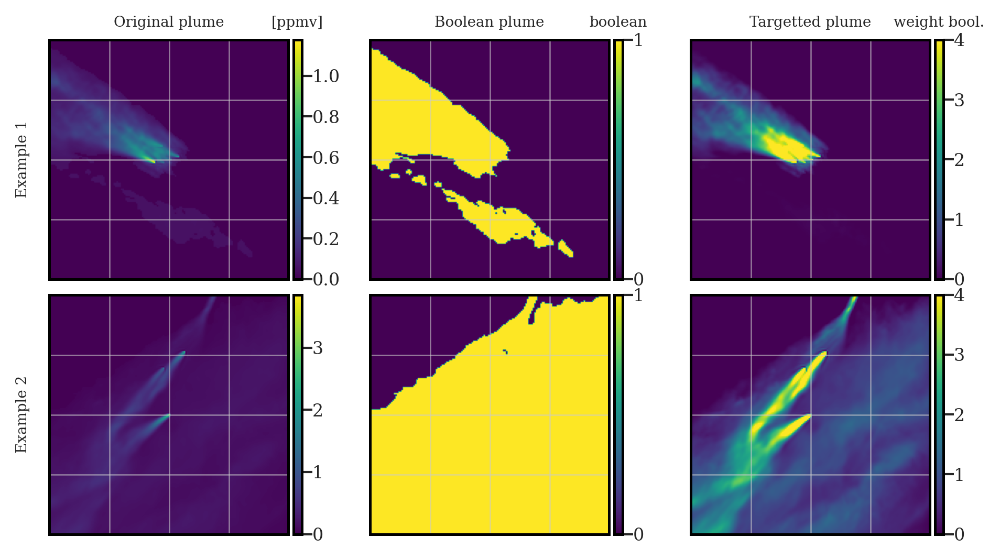

In [30]:
plt.viridis()
axs = matplotlib_functions.set_figure_axs(2, 3, wratio=0.35, 
                                          hratio=0.75, pad_w_ext_left=0.25, 
                                          pad_w_ext_right=0.25, pad_w_int=0.01, 
                                          pad_h_ext=0.2, pad_h_int=0.1)

im0 = axs[0].imshow(np.squeeze(ds_train.plume[idx0].values))
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
axs[0].set_title("Original plume")
axs[0].set_ylabel("Example 1")
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.set_title("[ppmv]")
cbar0.ax.tick_params(labelsize="8")

im1 = axs[1].imshow(np.where(np.squeeze(ds_train.plume[idx0].values)>0, 1,0))
axs[1].set_xticks([0,40,80,120,160])
axs[1].set_yticks([0,40,80,120,160])
axs[1].set_xticklabels([])
axs[1].set_yticklabels([])
axs[1].set_title("Boolean plume")
cax1 = axs[1].inset_axes((1.02, 0, 0.035, 1))
cbar1 = plt.colorbar(im1, cax1, orientation="vertical", ticks=[0, 1])
cbar1.ax.set_title("boolean")
cbar1.ax.tick_params(labelsize="8")

im2 = axs[2].imshow(np.squeeze(data.y.train[idx0]))
axs[2].set_xticks([0,40,80,120,160])
axs[2].set_yticks([0,40,80,120,160])
axs[2].set_xticklabels([])
axs[2].set_yticklabels([])
axs[2].set_title("Targetted plume")
cax2 = axs[2].inset_axes((1.02, 0, 0.035, 1))
cbar2 = plt.colorbar(im2, cax2, orientation="vertical")
cbar2.ax.set_title("weight bool.")
cbar2.ax.tick_params(labelsize="8")

im3 = axs[3].imshow(np.squeeze(ds_train.plume[idx1].values))
axs[3].set_xticks([0,40,80,120,160])
axs[3].set_yticks([0,40,80,120,160])
axs[3].set_xticklabels([])
axs[3].set_yticklabels([])
axs[3].set_ylabel("Example 2")
cax3 = axs[3].inset_axes((1.02, 0, 0.035, 1))
cbar3 = plt.colorbar(im3, cax3, orientation="vertical")
cbar3.ax.tick_params(labelsize="8")


im4 = axs[4].imshow(np.where(np.squeeze(ds_train.plume[idx1].values)>0, 1,0))
axs[4].set_xticks([0,40,80,120,160])
axs[4].set_yticks([0,40,80,120,160])
axs[4].set_xticklabels([])
axs[4].set_yticklabels([])
cax4 = axs[4].inset_axes((1.02, 0, 0.035, 1))
cbar4 = plt.colorbar(im4, cax4, orientation="vertical", ticks=[0, 1])
cbar4.ax.tick_params(labelsize="8")

im5 = axs[5].imshow(np.squeeze(data.y.train[idx1]))
axs[5].set_xticks([0,40,80,120,160])
axs[5].set_yticks([0,40,80,120,160])
axs[5].set_xticklabels([])
axs[5].set_yticklabels([])
cax5 = axs[5].inset_axes((1.02, 0, 0.035, 1))
cbar5 = plt.colorbar(im5, cax5, orientation="vertical")
cbar5.ax.tick_params(labelsize="8")

plt.savefig(os.path.join(dir_plots, f"paper_seg_justif_{name_run}_i{idx0}_i{idx1}.png"), transparent=True)
#print(os.path.join(dir_plots, f"paper_seg_justif_{name_run}_i{idx0}_i{idx1}.png"))

# U-net (figure 5)

In [32]:
fig3_ds = "LS_pPGIPP"
ds = xr.open_dataset(f"/libre/dumontj/coco2/dl-input/{fig3_ds}/2d_train_valid_dataset.nc")

In [33]:
idx0 = int(np.random.uniform(0,len(ds.idx_img)))
idx0 = 7162
ds_idx = ds.isel(idx_img=idx0)
print("idx:", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

idx: 7162
origin: smart_pBox_nBBox
time: 2015-12-01T07:00:00.000000000
emiss: [23.53901 20.05193 17.4363  16.12826 15.47433 15.69222]


<Figure size 1800x1200 with 0 Axes>

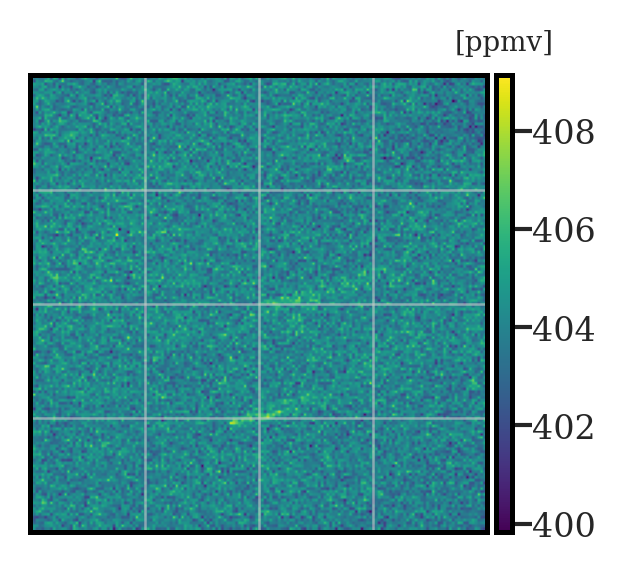

In [37]:
plt.viridis()
axs = matplotlib_functions.set_figure_axs(1, 1, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(np.squeeze(ds.xco2[idx0].values+np.random.randn(*ds.xco2[idx0].shape)))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.tick_params(labelsize="8")
cbar0.ax.set_title('[ppmv]')
plt.savefig (os.path.join(dir_plots, f"paper_seg_ds{fig3_ds}_xco2_i{idx0}.png"), transparent=True)

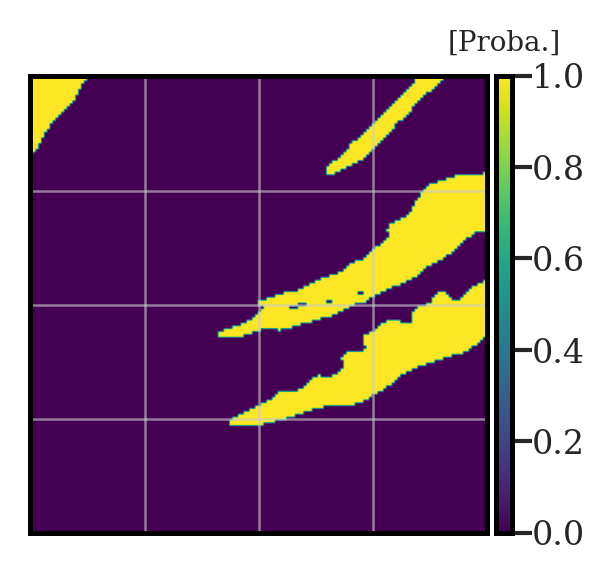

In [39]:
axs = matplotlib_functions.set_figure_axs(1, 1, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(np.where(np.squeeze(ds.plume[idx0].values)>0, 1,0))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.tick_params(labelsize="8")
cbar0.ax.set_title('[Proba.]')
plt.savefig (os.path.join(dir_plots, f"paper_seg_ds{fig3_ds}_seg_i{idx0}.png"), transparent=True)

# PGIBPP on PGIBPP (figure 6-7-8)

## Prep

In [207]:
case = "seg_box_DA"
dataset = case
weights = case
#["seg_box_DA", "seg_jan_DA_3", "seg_pPGIBPP_DA1_2", "seg_pPGIBPP_DA1_2"]

In [208]:
weights_ds = get_data_name(weights)
model = get_model(os.path.join(dir_res, weights))
scaler = get_scaler(os.path.join(dir_res, weights))
data = get_data(os.path.join(dir_res, dataset), scaler, mode)

data.shape (1152, 160, 160, 1)
data.x.test.shape (1152, 160, 160, 1)
data.y.test.shape (1152, 160, 160, 1)


In [209]:
x_test = tf.convert_to_tensor(data.x.test, np.float32)
pred_test = tf.convert_to_tensor(model.predict(x_test), np.float32)
y_test = tf.convert_to_tensor(data.y.test, np.float32)
loss_test = model.evaluate(x=x_test, y=y_test, batch_size=64)
data.y.get_plume(xr.open_dataset(data.path_dataset), data.eval_shuffler)
ds_test = xr.open_dataset(data.path_dataset)
xco2 = np.expand_dims(ds_test.xco2.values, -1)

all_loss_test = pixel_weighted_cross_entropy(y_test, pred_test, reduction=False)
all_loss_test = np.mean(all_loss_test,axis=(1,2))
print("mean loss:", np.mean(all_loss_test))
print("median loss:", np.median(all_loss_test))

18/18 [==============================] - 2s 67ms/step - loss: 0.2369
mean loss: 0.23690118
median loss: 0.17685893


## U-net application (figure 6)

In [216]:
idx0 = int(np.random.uniform(0,data.y.test.shape[0]))
print(model.compute_loss(y=y_test[idx0:idx0+1], y_pred=pred_test[idx0:idx0+1]).numpy())
ds_idx = ds_test.isel(idx_img=idx0)
print("idx0", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.17511363
idx0 1149
origin: smart_pBox_nBBox
time: 2015-12-20T21:00:00.000000000
emiss: [16.7804  16.94667 16.94673 17.27914 17.77762 18.27608]


In [219]:
idx1 = int(np.random.uniform(0,data.y.test.shape[0]))
ds_idx = ds_test.isel(idx_img=idx1)

print(model.compute_loss(y=y_test[idx1:idx1+1], y_pred=pred_test[idx1:idx1+1]).numpy())    
print("idx1", idx1)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.1710498
idx1 413
origin: smart_pBox_nBBox
time: 2015-05-05T05:00:00.000000000
emiss: [14.41466 13.33334 12.79257 12.97265 12.97261 14.23377]


<Figure size 1800x1200 with 0 Axes>

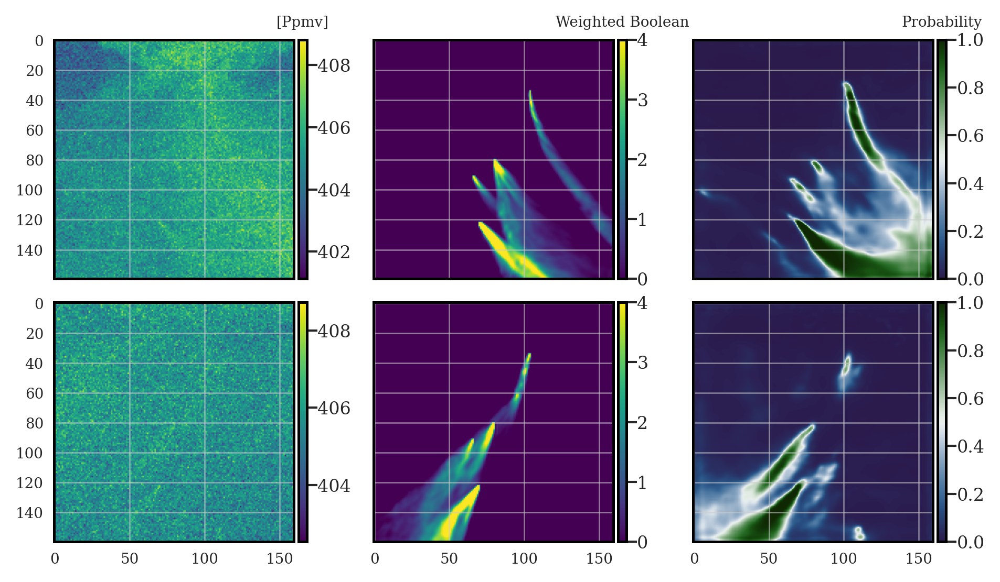

In [220]:
matplotlib_functions.setMatplotlibParam()
plt.viridis()
axs = matplotlib_functions.set_figure_axs(2, 3, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, 
                                          pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx0])))
axs[0].set_xticklabels([])
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.set_title("[Ppmv]")
cbar0.ax.tick_params(labelsize="8")

im1 = axs[1].imshow(np.squeeze(data.y.test[idx0]))
axs[1].set_xticklabels([])
axs[1].set_yticklabels([])
cax1 = axs[1].inset_axes((1.02, 0, 0.035, 1))
cbar1 = plt.colorbar(im1, cax1, orientation="vertical")
cbar1.ax.set_title("Weighted Boolean")
cbar1.ax.tick_params(labelsize="8")

im2 = axs[2].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx0], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[2].set_xticklabels([])
axs[2].set_yticklabels([])
cax2 = axs[2].inset_axes((1.02, 0, 0.035, 1))
cbar2 = plt.colorbar(im2, cax2, orientation="vertical")
cbar2.ax.set_title("Probability")
cbar2.ax.tick_params(labelsize="8")


im3 = axs[3].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx1])))
cax3 = axs[3].inset_axes((1.02, 0, 0.035, 1))
cbar3 = plt.colorbar(im3, cax3, orientation="vertical")
cbar3.ax.tick_params(labelsize="8")


im4 = axs[4].imshow(np.squeeze(data.y.test[idx1]))
axs[4].set_yticklabels([])
cax4 = axs[4].inset_axes((1.02, 0, 0.035, 1))
cbar4 = plt.colorbar(im4, cax4, orientation="vertical")
cbar4.ax.tick_params(labelsize="8")


im5 = axs[5].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx1], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[5].set_yticklabels([])
cax5 = axs[5].inset_axes((1.02, 0, 0.035, 1))
cbar5 = plt.colorbar(im5, cax5, orientation="vertical")
cbar5.ax.tick_params(labelsize="8")

plt.savefig(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{dataset}_i{idx0}_i{idx1}.png"),
           transparent=True)
#print(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_i{idx0}_i{idx1}.png"))

In [4]:
case = "seg_pPGIBPP_DA1_2"
dataset = case
weights = case
#["seg_box_DA", "seg_jan_DA_3", "seg_pPGIBPP_DA1_2"]

In [5]:
weights_ds = get_data_name(weights)
model = get_model(os.path.join(dir_res, weights))
scaler = get_scaler(os.path.join(dir_res, weights))
data = get_data(os.path.join(dir_res, dataset), scaler, mode)

2022-10-05 16:45:47.639832: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-05 16:45:48.101178: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14688 MB memory:  -> device: 0, name: Quadro RTX 5000, pci bus id: 0000:65:00.0, compute capability: 7.5


data.shape (5184, 160, 160, 1)
data.x.test.shape (5184, 160, 160, 1)
data.y.test.shape (5184, 160, 160, 1)


In [6]:
x_test = tf.convert_to_tensor(data.x.test, np.float32)
pred_test = tf.convert_to_tensor(model.predict(x_test), np.float32)
y_test = tf.convert_to_tensor(data.y.test, np.float32)
loss_test = model.evaluate(x=x_test, y=y_test, batch_size=64)
data.y.get_plume(xr.open_dataset(data.path_dataset), data.eval_shuffler)
ds_test = xr.open_dataset(data.path_dataset)
xco2 = np.expand_dims(ds_test.xco2.values, -1)

all_loss_test = pixel_weighted_cross_entropy(y_test, pred_test, reduction=False)
all_loss_test = np.mean(all_loss_test,axis=(1,2))
print("mean loss:", np.mean(all_loss_test))
print("median loss:", np.median(all_loss_test))

2022-10-05 16:46:10.200502: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8202
2022-10-05 16:46:10.621858: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


81/81 [==============================] - 10s 80ms/step - loss: 0.3070
mean loss: 0.30694985
median loss: 0.22891769


## U-net application (figure 6)

In [7]:
idx0 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="smart_pBer_nBBer")).idx_img.values)
idx0=4553
print(model.compute_loss(y=y_test[idx0:idx0+1], y_pred=pred_test[idx0:idx0+1]).numpy())
ds_idx = ds_test.isel(idx_img=idx0)
print("idx0", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.081858695
idx0 4553
origin: smart_pBer_nBBer
time: 2015-06-05T17:00:00.000000000
emiss: [15.0415  16.31126 17.49124 17.11351 15.88547 15.67583]


In [51]:
idx0 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="smart_pBer_nBBer")).idx_img.values)

print(model.compute_loss(y=y_test[idx0:idx0+1], y_pred=pred_test[idx0:idx0+1]).numpy())
print("pwbce", pixel_weighted_cross_entropy(y_test[idx0:idx0+1], pred_test[idx0:idx0+1]).numpy())
ds_idx = ds_test.isel(idx_img=idx0)
print("idx0", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.094289646
pwbce 0.094289646
idx0 4088
origin: smart_pBer_nBBer
time: 2015-01-19T08:00:00.000000000
emiss: [33.05797 33.55709 31.68185 24.16595 14.26594 12.07426]


In [52]:
print(model.compute_loss(y=y_test[idx0:idx0+1], y_pred=0.1*tf.ones(shape=(1,160,160))))
print("pwbce", pixel_weighted_cross_entropy(y_test[idx0:idx0+1], 0.1*tf.ones(shape=(1,160,160))))
ds_idx = ds_test.isel(idx_img=idx0)

tf.Tensor(0.3852547, shape=(), dtype=float32)
pwbce tf.Tensor(0.46193993, shape=(), dtype=float32)


In [8]:
idx1 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="smart_pBer_nBBer")).idx_img.values)
ds_idx = ds_test.isel(idx_img=idx1)

print(model.compute_loss(y=y_test[idx1:idx1+1], y_pred=pred_test[idx1:idx1+1]).numpy())    
print("idx1", idx1)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.16102673
idx1 4681
origin: smart_pBer_nBBer
time: 2015-07-20T01:00:00.000000000
emiss: [6.078887 6.384432 5.310567 5.99339  7.047192 8.332083]


<Figure size 1800x1200 with 0 Axes>

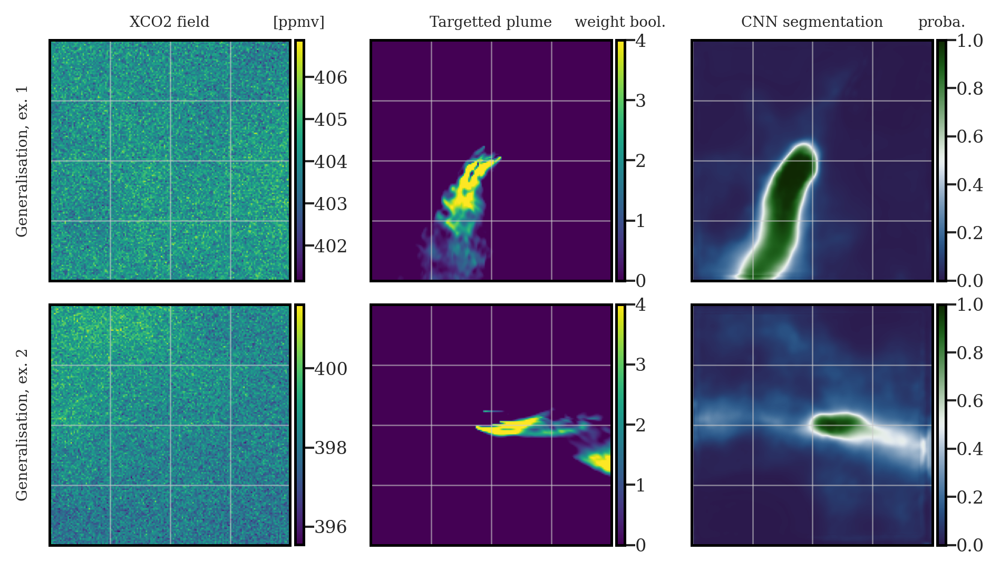

In [9]:
matplotlib_functions.setMatplotlibParam()
plt.viridis()
axs = matplotlib_functions.set_figure_axs(2, 3, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, 
                                          pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx0])))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
axs[0].set_title("XCO2 field")
axs[0].set_ylabel("Generalisation, ex. 1")
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.set_title("[ppmv]")
cbar0.ax.tick_params(labelsize="8")

im1 = axs[1].imshow(np.squeeze(data.y.test[idx0]))
axs[1].set_xticks([0,40,80,120,160])
axs[1].set_yticks([0,40,80,120,160])
axs[1].set_xticklabels([])
axs[1].set_yticklabels([])
axs[1].set_title("Targetted plume")
cax1 = axs[1].inset_axes((1.02, 0, 0.035, 1))
cbar1 = plt.colorbar(im1, cax1, orientation="vertical")
cbar1.ax.set_title("weight bool.")
cbar1.ax.tick_params(labelsize="8")

im2 = axs[2].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx0], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[2].set_xticks([0,40,80,120,160])
axs[2].set_yticks([0,40,80,120,160])
axs[2].set_xticklabels([])
axs[2].set_yticklabels([])
axs[2].set_title("CNN segmentation")
cax2 = axs[2].inset_axes((1.02, 0, 0.035, 1))
cbar2 = plt.colorbar(im2, cax2, orientation="vertical")
cbar2.ax.set_title("proba.")
cbar2.ax.tick_params(labelsize="8")


im3 = axs[3].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx1])))
axs[3].set_xticks([0,40,80,120,160])
axs[3].set_yticks([0,40,80,120,160])
axs[3].set_xticklabels([])
axs[3].set_yticklabels([])
axs[3].set_ylabel("Generalisation, ex. 2")
cax3 = axs[3].inset_axes((1.02, 0, 0.035, 1))
cbar3 = plt.colorbar(im3, cax3, orientation="vertical")
cbar3.ax.tick_params(labelsize="8")


im4 = axs[4].imshow(np.squeeze(data.y.test[idx1]))
axs[4].set_xticks([0,40,80,120,160])
axs[4].set_yticks([0,40,80,120,160])
axs[4].set_xticklabels([])
axs[4].set_yticklabels([])
cax4 = axs[4].inset_axes((1.02, 0, 0.035, 1))
cbar4 = plt.colorbar(im4, cax4, orientation="vertical")
cbar4.ax.tick_params(labelsize="8")


im5 = axs[5].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx1], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[5].set_xticks([0,40,80,120,160])
axs[5].set_yticks([0,40,80,120,160])
axs[5].set_xticklabels([])
axs[5].set_yticklabels([])
cax5 = axs[5].inset_axes((1.02, 0, 0.035, 1))
cbar5 = plt.colorbar(im5, cax5, orientation="vertical")
cbar5.ax.tick_params(labelsize="8")

plt.savefig(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{dataset}_i{idx0}_i{idx1}.png"),
           transparent=True)
#print(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_i{idx0}_i{idx1}.png"))

In [424]:
#idx0 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="smart_pLip_nBLip")).idx_img.values)
idx0 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="lsce_pPG_nBBO")).idx_img.values)
idx0=3137
print(model.compute_loss(y=y_test[idx0:idx0+1], y_pred=pred_test[idx0:idx0+1]).numpy())
ds_idx = ds_test.isel(idx_img=idx0)
print("idx0", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.22067899
idx0 3137
origin: smart_pLip_nBLip
time: 2015-09-19T17:00:00.000000000
emiss: [13.82406 14.21219 14.60046 14.72961 14.85829 15.11654]


In [425]:
idx1 = np.random.choice(ds_test.isel(idx_img=(ds_test.point_source=="lsce_pPGI_nBBO")).idx_img.values)
idx1=4028
ds_idx = ds_test.isel(idx_img=idx1)

print(model.compute_loss(y=y_test[idx1:idx1+1], y_pred=pred_test[idx1:idx1+1]).numpy())    
print("idx1", idx1)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.31173024
idx1 4028
origin: lsce_pPGI_nBBO
time: 2018-08-20T20:00:00.000000000
emiss: [26.013412 27.642054 31.726048 35.700317 39.80185  38.961277]


<Figure size 1920x1440 with 0 Axes>

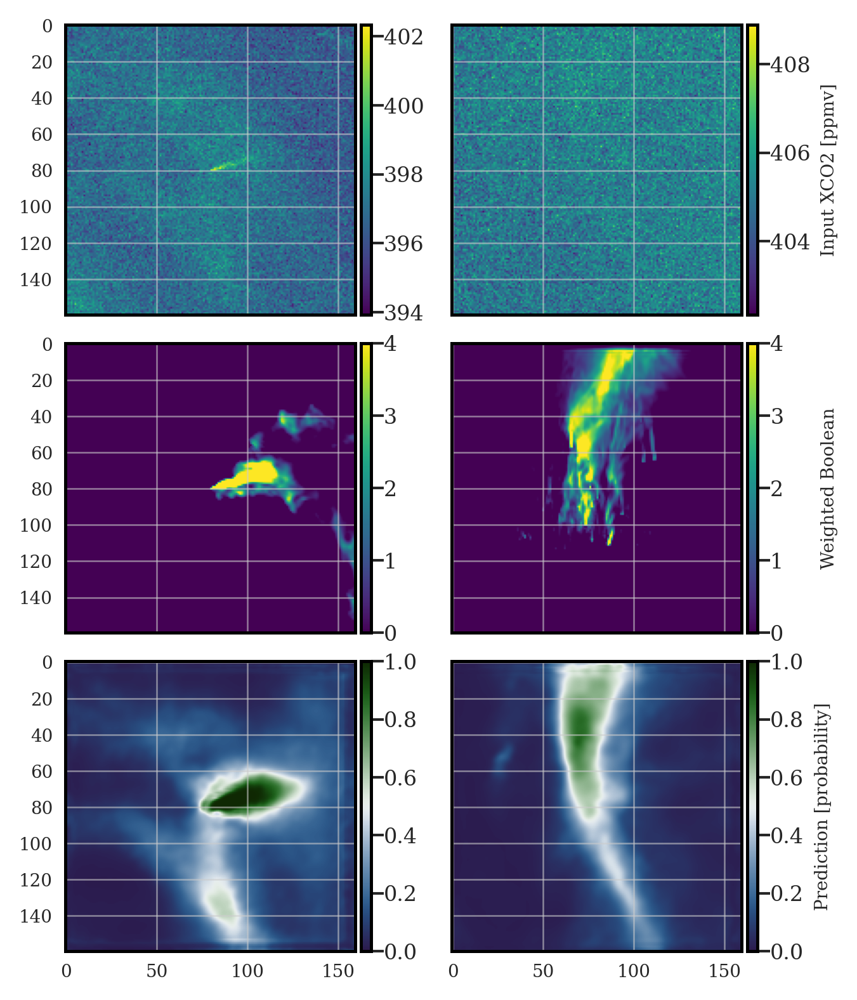

In [426]:
matplotlib_functions.setMatplotlibParam()
plt.viridis()
axs = matplotlib_functions.set_figure_axs(3, 2, wratio=0.35, hratio=0.75, pad_w_ext_left=0.25, pad_w_ext_right=0.25, pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx0])))
axs[0].set_xticklabels([])
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.tick_params(labelsize="8")

im1 = axs[1].imshow(scaler.inverse_transform(np.squeeze(data.x.test[idx1])))
axs[1].set_xticklabels([])
axs[1].set_yticklabels([])
cax1 = axs[1].inset_axes((1.02, 0, 0.035, 1))
cbar1 = plt.colorbar(im1, cax1, orientation="vertical", label="Input XCO2 [ppmv]")
cbar1.ax.tick_params(labelsize="8")

im2 = axs[2].imshow(np.squeeze(data.y.test[idx0]))
axs[2].set_xticklabels([])
cax2 = axs[2].inset_axes((1.02, 0, 0.035, 1))
cbar2 = plt.colorbar(im2, cax2, orientation="vertical")
cbar2.ax.tick_params(labelsize="8")

im3 = axs[3].imshow(np.squeeze(data.y.test[idx1]))
axs[3].set_xticklabels([])
axs[3].set_yticklabels([])
cax3 = axs[3].inset_axes((1.02, 0, 0.035, 1))
cbar3 = plt.colorbar(im3, cax3, orientation="vertical")
cbar3.set_label("Weighted Boolean", labelpad=14)
cbar3.ax.tick_params(labelsize="8")

im4 = axs[4].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx0], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
cax4 = axs[4].inset_axes((1.02, 0, 0.035, 1))
cbar4 = plt.colorbar(im4, cax4, orientation="vertical")
cbar4.ax.tick_params(labelsize="8")


im5 = axs[5].imshow(np.squeeze(model(tf.expand_dims(data.x.test[idx1], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[5].set_yticklabels([])
cax5 = axs[5].inset_axes((1.02, 0, 0.035, 1))
cbar5 = plt.colorbar(im5, cax5, orientation="vertical", label="Prediction [probability]")
cbar5.ax.tick_params(labelsize="8")

#plt.savefig(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_i{idx0}_i{idx1}.pdf"))
#print(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_i{idx0}_i{idx1}.png"))

## Histogram relative error (figure 7)

In [193]:
case = "seg_pPGIBPP_DA1_2"
dataset = case
weights = case
# seg_pPGIBPP_DA3_2
# seg_pPGIBPP_DA2
# seg_pPGIBPP_DA1
# seg_pPGIBPP
# seg_pPGIBPP_DA3
# seg_pPGIBPP_DA1_2
# seg_pPGIBPP_DA3_2
# seg_pPGIBPP_e5_DA1
# seg_pPGIBPP_DA2_2
#seg_pPGIBPP_e6_DA1
#["seg_box_DA", "seg_jan_DA", "seg_lip_DA", "seg_ber_DA_2"]

In [194]:
weights_ds = get_data_name(weights)
model = get_model(os.path.join(dir_res, weights))
scaler = get_scaler(os.path.join(dir_res, weights))
data = get_data(os.path.join(dir_res, dataset), scaler, mode)

data.x.test.shape[0] (5184, 160, 160, 1)
data.y.test.shape (5184, 160, 160, 1)


In [202]:
x_test = tf.convert_to_tensor(data.x.test, np.float32)
pred_test = tf.convert_to_tensor(model.predict(x_test), np.float32)
y_test = tf.convert_to_tensor(data.y.test, np.float32)
loss_test = model.evaluate(x=x_test, y=y_test, batch_size=64)
data.y.get_plume(xr.open_dataset(data.path_dataset), data.eval_shuffler)
ds_test = xr.open_dataset(data.path_dataset)
xco2 = np.expand_dims(ds_test.xco2.values, -1)

all_loss_test = pixel_weighted_cross_entropy(y_test, pred_test, reduction=False)
all_loss_test = np.mean(all_loss_test,axis=(1,2))
print("mean loss:", np.mean(all_loss_test))
print("median loss:", np.median(all_loss_test))

81/81 [==============================] - 6s 80ms/step - loss: 0.3068
mean loss: 0.30679822
median loss: 0.22805627


In [203]:
n_outliers_val = int(0.01*len(all_loss_test))
indices_with_no_outliers = np.argpartition(all_loss_test, -n_outliers_val)[:-n_outliers_val]
df = pd.DataFrame({'loss': all_loss_test[indices_with_no_outliers],
                   'origin': ds_test.point_source.values[indices_with_no_outliers].astype(str),
                   'time': ds_test.v_hour.values[indices_with_no_outliers],
                   'emiss': ds_test.emiss.values[indices_with_no_outliers,0]
                  })
df["origin"] = np.where(df["origin"].values == "smart_pBox_nBBox", "Boxberg (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pLip_nBLip", "Lippendorf (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pJan_nBJan", "Janschwälde (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "lsce_pPG_nBBO", "Grand Paris", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "lsce_pPGI_nBBO", "Grand Paris + IDF", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pBer_nBBer", "Berlin", df["origin"].values)

In [211]:
df = df.drop(df[df["origin"] == "Janschwälde (PP)"].index)
df = df.drop(df[df["origin"] == "Boxberg (PP)"].index)

In [212]:
df

,loss,origin,time,emiss
0,0.215218,Berlin,13,16.909389
120,0.185650,Berlin,22,11.315780
121,0.445987,Berlin,21,16.740681
125,0.170008,Berlin,20,19.683010
126,0.267531,Berlin,19,20.294630
...,...,...,...,...
5124,1.491334,Lippendorf (PP),0,11.268480
5125,1.334432,Lippendorf (PP),14,16.263260
5128,1.275633,Lippendorf (PP),22,11.186540
5130,1.316209,Lippendorf (PP),0,9.205608


In [197]:
print("Berlin mean", np.mean(df[df["origin"]=="Berlin"]["loss"]))
print("Berlin median", np.median(df[df["origin"]=="Berlin"]["loss"]))
print("Boxberg (PP) mean", np.mean(df[df["origin"]=="Boxberg (PP)"]["loss"]))
print("Boxberg (PP) median", np.median(df[df["origin"]=="Boxberg (PP)"]["loss"]))
print("Lippendorf (PP) mean", np.mean(df[df["origin"]=="Lippendorf (PP)"]["loss"]))
print("Lippendorf (PP) median", np.median(df[df["origin"]=="Lippendorf (PP)"]["loss"]))
print("Janschwälde (PP) mean", np.mean(df[df["origin"]=="Janschwälde (PP)"]["loss"]))
print("Janschwälde (PP) median", np.median(df[df["origin"]=="Janschwälde (PP)"]["loss"]))
print("Grand Paris mean", np.mean(df[df["origin"]=="Grand Paris"]["loss"]))
print("Grand Paris median", np.median(df[df["origin"]=="Grand Paris"]["loss"]))
print("Grand Paris + IDF mean", np.mean(df[df["origin"]=="Grand Paris + IDF"]["loss"]))
print("Grand Paris + IDF median", np.median(df[df["origin"]=="Grand Paris + IDF"]["loss"]))

Berlin mean 0.22004719
Berlin median 0.17348221
Boxberg (PP) mean 0.31907305
Boxberg (PP) median 0.25360727
Lippendorf (PP) mean 0.27904487
Lippendorf (PP) median 0.18942948
Janschwälde (PP) mean 0.34083056
Janschwälde (PP) median 0.293505
Grand Paris mean 0.25108775
Grand Paris median 0.22313133
Grand Paris + IDF mean 0.34376746
Grand Paris + IDF median 0.30935553


In [213]:
#list_cases = ["seg_box_DA", "seg_jan_DA_3", "seg_lip_DA_2", "seg_ber_DA_2","seg_par_DA"]
list_cases = ["seg_box_DA", "seg_jan_DA_3"]

In [214]:
for case in list_cases:
    print ("case", case)
    dataset = case
    weights = case
    config_weights = TreeConfigParser()
    config_weights.readfiles(os.path.join(dir_res, weights, "config.cfg"))
    weights_ds = config_weights.get("data.directory.name")

    model = get_model(os.path.join(dir_res, weights))
    scaler = get_scaler(os.path.join(dir_res, weights))
    data = get_data(os.path.join(dir_res, dataset), scaler, mode)
    
    ds_test = xr.open_dataset(data.path_dataset)
    x_test = tf.convert_to_tensor(data.x.test, np.float32)
    pred_test = tf.convert_to_tensor(model.predict(x_test), np.float32)
    y_test = tf.convert_to_tensor(data.y.test, np.float32)
    
    all_loss_test = pixel_weighted_cross_entropy(y_test, pred_test, reduction=False)
    all_loss_test = np.mean(all_loss_test,axis=(1,2))
    print("mean loss:", np.mean(all_loss_test))
    print("median loss:", np.median(all_loss_test))
    n_outliers_val = int(0.01*len(all_loss_test))
    indices_with_no_outliers = np.argpartition(all_loss_test, -n_outliers_val)[:-n_outliers_val]
    indices_outliers = np.argpartition(all_loss_test, -n_outliers_val)[-n_outliers_val:]
    df = pd.concat([df, pd.DataFrame({'loss': all_loss_test[indices_with_no_outliers],
                       'origin': ds_test.point_source.values[indices_with_no_outliers].astype(str),
                       'time': ds_test.v_hour.values[indices_with_no_outliers],
                       'emiss': ds_test.emiss.values[indices_with_no_outliers,0]
                      })], ignore_index=True)

case seg_box_DA
data.x.test.shape[0] (1152, 160, 160, 1)
data.y.test.shape (1152, 160, 160, 1)
mean loss: 0.23670901
median loss: 0.18011117
case seg_jan_DA_3
data.x.test.shape[0] (1152, 160, 160, 1)
data.y.test.shape (1152, 160, 160, 1)
mean loss: 0.24248913
median loss: 0.17658073


paper_seg_wLS_pPGIBPP_dsS_pJan_hist_origin.pdf


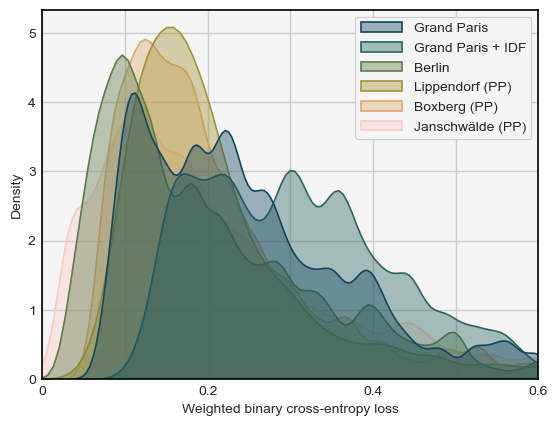

In [229]:
df["origin"] = np.where(df["origin"].values == "smart_pBox_nBBox", "Boxberg (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pLip_nBLip", "Lippendorf (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pJan_nBJan", "Janschwälde (PP)", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "lsce_pPG_nBBO", "Grand Paris", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "lsce_pPGI_nBBO", "Grand Paris + IDF", df["origin"].values)
df["origin"] = np.where(df["origin"].values == "smart_pBer_nBBer", "Berlin", df["origin"].values)
plt.rcdefaults()
sns.set_context('paper')
sns.set_style('whitegrid')

plt.rc('lines',         linewidth           = 0.5)
plt.rc('font',          family              = 'sans-serif')
plt.rc('savefig',       facecolor           = 'white')
plt.rc('axes',          linewidth           = 1.2)
plt.rc('axes',          edgecolor           = 'k')
plt.rc('axes',          facecolor           = [0.96, 0.96, 0.96])
plt.rc('axes',          labelsize           = 15)
plt.rc('axes',          titlesize           = 15)
plt.rc('legend',        fontsize            = 10)
plt.rc('legend',        frameon             = True)
plt.rc('legend',        framealpha          = 1)
plt.rc('legend',        handlelength        = 3)
plt.rc('legend',        numpoints           = 3)
plt.rc('legend',        markerscale         = 1)
plt.rc('xtick',         labelsize           = 'x-small')
plt.rc('ytick',         labelsize           = 'x-small')
plt.rc('xtick.major',   pad                 = 0)
plt.rc('ytick.major',   pad                 = 0)

ax = sns.kdeplot(
    data=df,
    x="loss",
    hue="origin",
    common_norm=False,
    fill=True,
    lw=1.2,
    alpha=0.4,
    levels=1,
    bw_adjust = 0.3, 
    palette="cmc.batlowW", # batlowW, batlowW_r batlowW_r  berlin bukavu  bukavu_r vik vikO vikO_r vik_r
    hue_order = ["Grand Paris", "Grand Paris + IDF", "Berlin", "Lippendorf (PP)", "Boxberg (PP)", "Janschwälde (PP)", ],
)


plt.xlabel("Weighted binary cross-entropy loss", size=10)
plt.ylabel("Density", size=10)
plt.xticks(size=10)
plt.xticks([0, 0.1, 0.2, 0.3, 0.4,0.5,0.6], 
           labels = [0, '', 0.2, '', 0.4, '', 0.6])
plt.xlim(0,0.6)
plt.yticks(size=10)
plt.grid(linewidth=1., alpha=1)
ax.legend_.set_title(None)
plt.setp(ax.get_legend().get_texts(), fontsize='10')
plt.setp(ax.get_legend().get_title(), fontsize='10')
plt.savefig(os.path.join(dir_plots, f"paper_seg_wLS_pPGIBPP_dsLS_pPGIBPP_hist_origin.pdf"))
print(f"paper_seg_wLS_pPGIBPP_ds{data.name_dataset}_hist_origin.pdf")

# PGIPP on B (figure 9-10)

## Prep

In [55]:
dataset = "seg_ber"
#weights = "seg_PGIPP_DA2_1_Unet_efficient"
weights = "seg_PGIPP_0"
# TRY : weights = seg_PGIPP_0, seg_PGIPP_1, seg_PGIPP_2, seg_PGIPP_3

In [56]:
config_weights = TreeConfigParser()
config_weights.readfiles(os.path.join(dir_res, weights, "config.cfg"))
weights_ds = config_weights.get("data.directory.name")

In [57]:
model = get_model(os.path.join(dir_res, weights))
scaler = get_scaler(os.path.join(dir_res, weights))
config = TreeConfigParser()
config.readfiles(os.path.join(dir_res, dataset, "config.cfg"))
data = Data(config)
data.prepare_input(scaler)
data.prepare_output()

data.shape (7441, 160, 160, 1)
data.x.train.shape (6577, 160, 160, 1)
data.y.train.shape (6577, 160, 160, 1)


In [58]:
data.x.train.shape

(6577, 160, 160, 1)

In [59]:
x_train = tf.convert_to_tensor(data.x.train, np.float32)
pred_train = tf.convert_to_tensor(model.predict(x_train), np.float32)
y_train = tf.convert_to_tensor(data.y.train, np.float32)
loss_train = model.evaluate(x=x_train, y=y_train, batch_size=64)
data.y.get_plume(xr.open_dataset(data.path_dataset), data.eval_shuffler)
ds_train = xr.open_dataset(data.path_dataset)
xco2 = np.expand_dims(ds_train.xco2.values, -1)

all_loss_train = pixel_weighted_cross_entropy(y_train, pred_train, reduction=False)
all_loss_train = np.mean(all_loss_train,axis=(1,2))
print("mean loss:", np.mean(all_loss_train))
print("median loss:", np.median(all_loss_train))

103/103 [==============================] - 9s 79ms/step - loss: 0.2731
mean loss: 0.27308166
median loss: 0.22650489


## Histogram (figure 9)

In [24]:
all_loss_train = pixel_weighted_cross_entropy(y_train, pred_train, reduction=False)
all_loss_train = np.mean(all_loss_train,axis=(1,2))
n_outliers_val = int(0.01*len(all_loss_train))
indices_with_no_outliers = np.argpartition(all_loss_train, -n_outliers_val)[:-n_outliers_val]
indices_outliers = np.argpartition(all_loss_train, -n_outliers_val)[-n_outliers_val:]

In [25]:
df_no_outliers = pd.DataFrame({'loss': all_loss_train[indices_with_no_outliers],
                   'origin': ds_train.point_source.values[indices_with_no_outliers].astype(str),
                   'time': ds_train.v_hour.values[indices_with_no_outliers],
                   'emiss': ds_train.emiss.values[indices_with_no_outliers,0]
                  })
df = df_no_outliers

In [26]:
df["emiss"] = pd.qcut(df["emiss"], q=4, precision=2)

In [27]:
plt.rcdefaults()
sns.set_context('paper')
sns.set_style('whitegrid')

plt.rc('lines',         linewidth           = 0.5)
plt.rc('font',          family              = 'sans-serif')
plt.rc('savefig',       facecolor           = 'white')
plt.rc('axes',          linewidth           = 1.2)
plt.rc('axes',          edgecolor           = 'k')
plt.rc('axes',          facecolor           = [0.96, 0.96, 0.96])
plt.rc('axes',          labelsize           = 15)
plt.rc('axes',          titlesize           = 15)
plt.rc('legend',        fontsize            = 10)
plt.rc('legend',        frameon             = True)
plt.rc('legend',        framealpha          = 1)
plt.rc('legend',        handlelength        = 3)
plt.rc('legend',        numpoints           = 3)
plt.rc('legend',        markerscale         = 1)
plt.rc('xtick',         labelsize           = 'x-small')
plt.rc('ytick',         labelsize           = 'x-small')
plt.rc('xtick.major',   pad                 = 0)
plt.rc('ytick.major',   pad                 = 0)


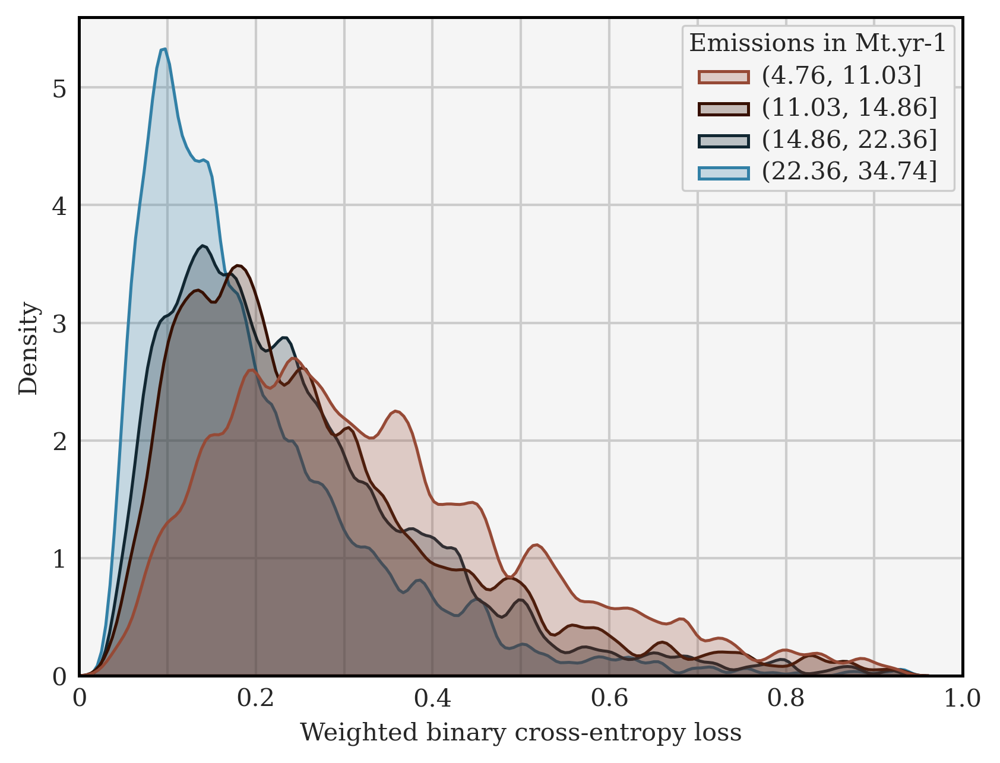

In [96]:
ax = sns.kdeplot(
    data=df,
    x="loss",
    hue="emiss",
    common_norm=False,
    fill=True,
    lw=1.2,
    alpha=0.25,
    levels=1,
    bw_adjust = 0.3, 
    palette="cmc.berlin_r"
    #palette=["firebrick", "orangered", "darkolivegreen", "dodgerblue", "darkcyan"],
    #hue_order = ["Grand Paris + IDF", "Grand Paris", "Lippendorf (PP)", "Boxberg (PP)", "Janschwälde (PP)"],
)
ax.legend_.set_title("Emissions in Mt.yr-1")
plt.xlim(xmin=0)
plt.xlabel("Weighted binary cross-entropy loss", size=10)
plt.ylabel("Density", size=10)
plt.xticks(size=10)
plt.xticks([0, 0.1, 0.2, 0.3, 0.4,0.5,0.6,0.7,0.8, 0.9, 1.0], 
           labels = [0, '', 0.2, '', 0.4, '', 0.6, '', 0.8, '', 1.0])
plt.xlim(0,1)
plt.yticks(size=10)
plt.grid(linewidth=1., alpha=1)
plt.setp(ax.get_legend().get_texts(), fontsize='10')
plt.setp(ax.get_legend().get_title(), fontsize='10')
plt.savefig(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_hist_origin.png"))

In [60]:
pred_train = 0.1*tf.ones(shape=y_train.shape)

In [61]:
all_loss_train = pixel_weighted_cross_entropy(y_train, pred_train, reduction=False)
all_loss_train = np.mean(all_loss_train,axis=(1,2))
n_outliers_val = int(0.01*len(all_loss_train))
indices_with_no_outliers = np.argpartition(all_loss_train, -n_outliers_val)[:-n_outliers_val]
indices_outliers = np.argpartition(all_loss_train, -n_outliers_val)[-n_outliers_val:]

In [64]:
df_no_outliers = pd.DataFrame({'loss': all_loss_train[indices_with_no_outliers],
                   'origin': ds_train.point_source.values[indices_with_no_outliers].astype(str),
                   'time': ds_train.v_hour.values[indices_with_no_outliers],
                   'emiss': ds_train.emiss.values[indices_with_no_outliers,0]
                  })
df = df_no_outliers

In [65]:
df["emiss"] = pd.qcut(df["emiss"], q=4, precision=2)

In [66]:
plt.rcdefaults()
sns.set_context('paper')
sns.set_style('whitegrid')

plt.rc('lines',         linewidth           = 0.5)
plt.rc('font',          family              = 'sans-serif')
plt.rc('savefig',       facecolor           = 'white')
plt.rc('axes',          linewidth           = 1.2)
plt.rc('axes',          edgecolor           = 'k')
plt.rc('axes',          facecolor           = [0.96, 0.96, 0.96])
plt.rc('axes',          labelsize           = 15)
plt.rc('axes',          titlesize           = 15)
plt.rc('legend',        fontsize            = 10)
plt.rc('legend',        frameon             = True)
plt.rc('legend',        framealpha          = 1)
plt.rc('legend',        handlelength        = 3)
plt.rc('legend',        numpoints           = 3)
plt.rc('legend',        markerscale         = 1)
plt.rc('xtick',         labelsize           = 'x-small')
plt.rc('ytick',         labelsize           = 'x-small')
plt.rc('xtick.major',   pad                 = 0)
plt.rc('ytick.major',   pad                 = 0)


[None, None]

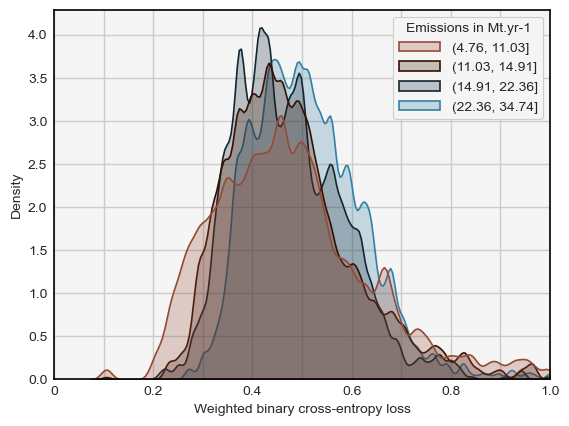

In [68]:
ax = sns.kdeplot(
    data=df,
    x="loss",
    hue="emiss",
    common_norm=False,
    fill=True,
    lw=1.2,
    alpha=0.25,
    levels=1,
    bw_adjust = 0.3, 
    palette="cmc.berlin_r"
    #palette=["firebrick", "orangered", "darkolivegreen", "dodgerblue", "darkcyan"],
    #hue_order = ["Grand Paris + IDF", "Grand Paris", "Lippendorf (PP)", "Boxberg (PP)", "Janschwälde (PP)"],
)
ax.legend_.set_title("Emissions in Mt.yr-1")
plt.xlim(xmin=0)
plt.xlabel("Weighted binary cross-entropy loss", size=10)
plt.ylabel("Density", size=10)
plt.xticks(size=10)
plt.xticks([0, 0.1, 0.2, 0.3, 0.4,0.5,0.6,0.7,0.8, 0.9, 1.0], 
           labels = [0, '', 0.2, '', 0.4, '', 0.6, '', 0.8, '', 1.0])
plt.xlim(0,1)
plt.yticks(size=10)
plt.grid(linewidth=1., alpha=1)
plt.setp(ax.get_legend().get_texts(), fontsize='10')
plt.setp(ax.get_legend().get_title(), fontsize='10')
#plt.savefig(os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{data.name_dataset}_hist_origin.png"))

## U-net application (figure 10)

In [77]:
idx0 = int(np.random.uniform(0,data.y.train.shape[0]*0.2))
print(model.compute_loss(y=y_train[idx0:idx0+1], y_pred=pred_train[idx0:idx0+1]).numpy())
ds_idx = ds_train.isel(idx_img=idx0)
print ("idx:", idx0)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)

0.121477224
idx: 668
origin: smart_pBer_nBBer
time: 2015-02-01T20:00:00.000000000
emiss: [25.21156 25.95463 28.31611 28.24315 26.3416  24.95263]


In [73]:
idx1 = int(np.random.uniform(0,data.y.train.shape[0]*0.2))
ds_idx = ds_train.isel(idx_img=idx1)

print(model.compute_loss(y=y_train[idx1:idx1+1], y_pred=pred_train[idx1:idx1+1]).numpy())    
print ("idx:", idx1)
print("origin:", ds_idx.point_source.values)
print("time:", ds_idx.time.values)
print("emiss:", ds_idx.emiss.values)


0.24704833
idx: 152
origin: smart_pBer_nBBer
time: 2015-01-09T08:00:00.000000000
emiss: [33.05797 33.55709 31.68185 24.16595 14.26594 12.07426]


/cerea_raid/users/dumontj/dev/coco2/dl/eval/pres-seg/paper_seg_wLS_pPGIPP_dsseg_ber_i668_i152.png


<Figure size 1800x1200 with 0 Axes>

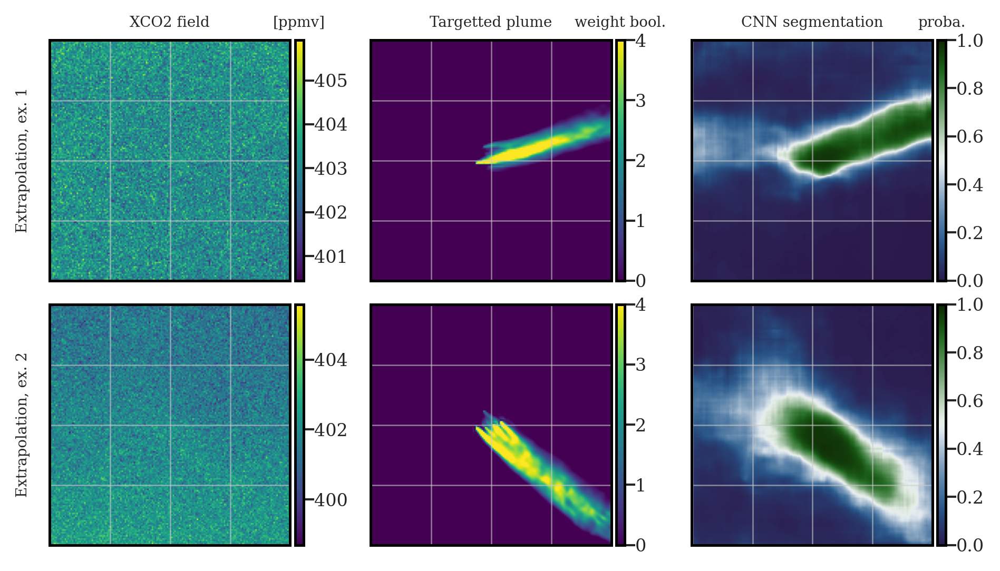

In [79]:
matplotlib_functions.setMatplotlibParam()
plt.viridis()
axs = matplotlib_functions.set_figure_axs(2, 3, wratio=0.35, hratio=0.75, 
                                          pad_w_ext_left=0.25, pad_w_ext_right=0.25, 
                                          pad_w_int=0.001, pad_h_ext=0.2, pad_h_int=0.15)

im0 = axs[0].imshow(scaler.inverse_transform(np.squeeze(data.x.train[idx0])))
axs[0].set_xticks([0,40,80,120,160])
axs[0].set_yticks([0,40,80,120,160])
axs[0].set_xticklabels([])
axs[0].set_yticklabels([])
axs[0].set_title("XCO2 field")
axs[0].set_ylabel("Extrapolation, ex. 1")
cax0 = axs[0].inset_axes((1.02, 0, 0.035, 1))
cbar0 = plt.colorbar(im0, cax0, orientation="vertical")
cbar0.ax.set_title("[ppmv]")
cbar0.ax.tick_params(labelsize="8")

im1 = axs[1].imshow(np.squeeze(data.y.train[idx0]))
axs[1].set_xticks([0,40,80,120,160])
axs[1].set_yticks([0,40,80,120,160])
axs[1].set_xticklabels([])
axs[1].set_yticklabels([])
axs[1].set_title("Targetted plume")
cax1 = axs[1].inset_axes((1.02, 0, 0.035, 1))
cbar1 = plt.colorbar(im1, cax1, orientation="vertical")
cbar1.ax.set_title("weight bool.")
cbar1.ax.tick_params(labelsize="8")

im2 = axs[2].imshow(np.squeeze(model(tf.expand_dims(data.x.train[idx0], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[2].set_xticks([0,40,80,120,160])
axs[2].set_yticks([0,40,80,120,160])
axs[2].set_xticklabels([])
axs[2].set_yticklabels([])
axs[2].set_title("CNN segmentation")
cax2 = axs[2].inset_axes((1.02, 0, 0.035, 1))
cbar2 = plt.colorbar(im2, cax2, orientation="vertical")
cbar2.ax.set_title("proba.")
cbar2.ax.tick_params(labelsize="8")


im3 = axs[3].imshow(scaler.inverse_transform(np.squeeze(data.x.train[idx1])))
axs[3].set_xticks([0,40,80,120,160])
axs[3].set_yticks([0,40,80,120,160])
axs[3].set_xticklabels([])
axs[3].set_yticklabels([])
axs[3].set_ylabel("Extrapolation, ex. 2")
cax3 = axs[3].inset_axes((1.02, 0, 0.035, 1))
cbar3 = plt.colorbar(im3, cax3, orientation="vertical")
cbar3.ax.tick_params(labelsize="8")


im4 = axs[4].imshow(np.squeeze(data.y.train[idx1]))
axs[4].set_xticks([0,40,80,120,160])
axs[4].set_yticks([0,40,80,120,160])
axs[4].set_xticklabels([])
axs[4].set_yticklabels([])
cax4 = axs[4].inset_axes((1.02, 0, 0.035, 1))
cbar4 = plt.colorbar(im4, cax4, orientation="vertical")
cbar4.ax.tick_params(labelsize="8")


im5 = axs[5].imshow(np.squeeze(model(tf.expand_dims(data.x.train[idx1], 0))[0]), 
                    vmin=0, vmax=1, cmap = cm.cork)
axs[5].set_xticks([0,40,80,120,160])
axs[5].set_yticks([0,40,80,120,160])
axs[5].set_xticklabels([])
axs[5].set_yticklabels([])
cax5 = axs[5].inset_axes((1.02, 0, 0.035, 1))
cbar5 = plt.colorbar(im5, cax5, orientation="vertical")
cbar5.ax.tick_params(labelsize="8")

path_save = os.path.join(dir_plots, f"paper_seg_w{weights_ds}_ds{dataset}_i{idx0}_i{idx1}.png")
plt.savefig(path_save,transparent=True)
print(path_save)